# Function interpolation - simulation study 

This notebook runs a simple simulation study comparing the performance of several multidimensional interpolation methods.

Ultimately, the goal is to implement interpolation methods in *respy*, an open-source Python package for the estimation of dynamic discrete-choice models.

# Motivation



In their 1994 paper, Keane and Wolpin propose an algorithm to effectively reduce the required number of Monte-Carlo integrations for solving a dynamic discrete choice model. Their approach aims at the calculation of continuation values in the backward induction solution algorithm. They propose to solve for the continuation values using Monte-Carlo methods only for a subset of points in the state space and then to interpolate the continuation values on the remaining points. They initially propose to run a regression using information on conditional continuation values. In doing so, they do not exploit information on the underlying state space in the sense that the values of the state variables at a given point of the state space do not enter the calculation. An alternative approach, thus, is to interpret the expected continuation value as a function of all state variables and interpolate directly on the high-dimensional state space. High-dimensional interpolation is less straight-forward than the univariate case and in recent years, a variety of methods has emerged. This study strives to present and compare a selection of these methods.

# Framework for the study

For this study, two test functions have been selected - one motivated by an engineering appliation (the borehole function) and one function specifically designed for testing numerical methods (the Zhou (1998) function). Both functions have been taken from Surjanov & Bingham (2013).

The Borehole function models water flow through a borehole. It models the water flow rate, in $m^3 / yr$ as a function of eight input factors:

$$ f(x) = \frac{2 \pi T_u (H_u - H_l)}{\ln(r / r_w) (1+\frac{2 L T_u}{\ln(r / r_w) r_w^2 K_w}  + \frac{T_u}{T_l} } $$
    
where variables and standard domains are

* $r_w \in [0.05, 0.15]$: radius of borehole ($m$)
* $r \in [100, 50000]$: radius of influence ($m$)
* $T_u \in [63070, 115600]$: transmissivity of upper aquifer ($m^2 / yr$)
* $H_u \in [990, 1110]$: potentiometric head of upper aquifer ($m$)
* $T_l \in [63.1, 116]$: transmissivity of lower aquifer ($m^2 / yr$)
* $H_l \in [700, 820]$: potentiometric head of lower aquifer ($m$)
* $L \in [1120, 1680]$: length of borehole ($m$)
* $K_w \in [1500, 15000]$: hydraulic conductivity of borehole ($m / yr$)

Varying only the first two input arguments ($r_w$ and $r$) and keeping all other variables fixed at the mid point of their respective domain, the function obtains the following shape:

In [1]:
%load_ext autoreload
%matplotlib inline

import copy
import json
import os
import pdb  # noqa:F401
import pickle
import sys

root = os.path.dirname(os.path.abspath(sys.argv[0]))
sys.path.insert(0, root)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


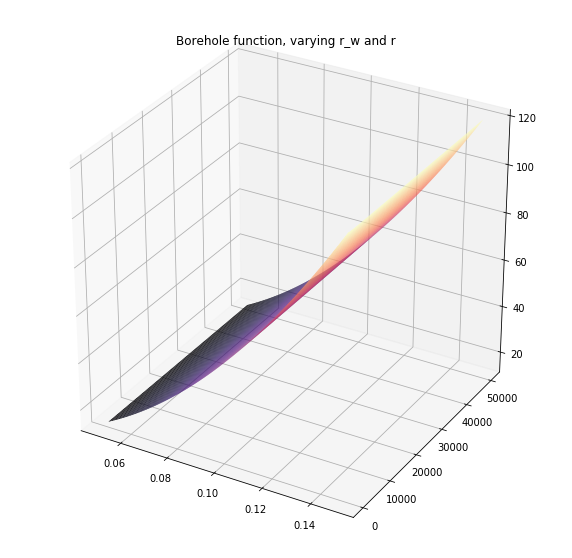

In [2]:
%load_ext autoreload
%matplotlib inline

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import src.functions_to_approximate as functions


x = np.linspace(0.05, 0.15, 100)
y = np.linspace(100, 50000, 100)
X, Y = np.meshgrid(x,y)

grid = np.asarray([X.reshape(10000), Y.reshape(10000)]).T
f_2 = functions.borehole_wrapper_vectorize(grid)
f_2 = np.asarray(f_2).reshape((100, 100))

fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(111, projection='3d',title="Borehole function, varying r_w and r")
ax.plot_surface(X, Y, f_2, rstride=1, cstride=1, cmap=plt.cm.magma)

The Zhou function is considered by Zhou (1998) for the numerical integration of spiky functions. It has been pointed out in the literature that this function is such that there is no reason to expect it to be approximately a low-order polynomial. The function is defined for an arbitrary number of dimensions $d$:

$$ f(x) = \frac{10^d}{2} [\phi(10(x-\frac{1}{3})) + \phi(10(x-\frac{2}{3}))]$$
with
$$ \phi(z) = (2\pi)^{-0.5 d} \exp(-0.5 {\| z \|}^2)$$

The Zhou function is defined on the domain $[0, 1]^d$. For $d=2$, the function takes on the following shape:

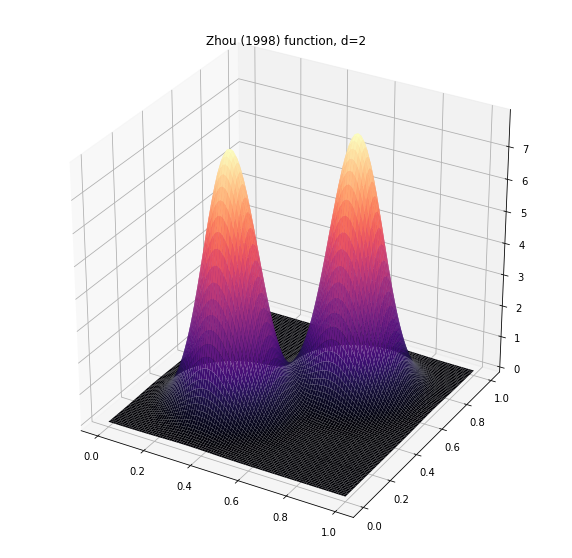

In [3]:
x = y = np.linspace(0.0, 1.0, 100)
X, Y = np.meshgrid(x,y)

grid = np.asarray([X.reshape(10000), Y.reshape(10000)]).T
f_2 = functions.zhou_vectorize(grid)
f_2 = np.asarray(f_2).reshape((100, 100))

fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(111, projection='3d',title="Zhou (1998) function, d=2")
ax.plot_surface(X, Y, f_2, rstride=1, cstride=1, cmap=plt.cm.magma)


As can be seen from above graphs, the study features one close to linear function and one highly non-linear function. 

The code is set up flexibly such that alternative target functions can easily be implemented and analysed. 

# Basic code framework and benchmark analysis

In this section, the basic functions and parameter files used to run the code are introduced and demonstrated by running an example with the most straightforward method: a linear interpolator defined over a regular (i.e. evenly spaced) grid.

## Prepare environment

The entire codebase for this study can be found in the repository under .src/

### Load functions

In [4]:
%load_ext autoreload
%matplotlib inline

from src.execute import execute_study
from src.execute import plot_results
from src.execute import compare_results
from src.execute import compare_fit_2d_iter

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Load default parameters

Default parameters are stored in json-files:

* Default parameters for running the simulation routine: ./src/study_params.json
* Default parameters for the interpolation functions: ./src/interp_params.json 

In [5]:
# load default interpolation parameters
with open("./src/interp_params.json") as json_file:
    interp_params = json.load(json_file)

# load default study parameters
with open("./src/study_params.json") as json_file:
    params_default = json.load(json_file)

study_params.json stores information on:
* controls
    - interpolation method: "linear", "spline", "smolyak", "sparse"
    - grid method (currently only relevant for linear interpolation): "regular", "sparse"
    - evaluate off-grid: "True", "False" (indicator, whether off-grid function values are interpolated)
    - dims: list of dimensions to contain in run
    - iterations: length of vector of iterable for study (interpolation points or sparse grid level) 
    - function to approximate: "borehole_readable", "borehole_wrapper_vectorize", "borehole_wrapper_iter", "zhou_readable", "zhou_vectorize"
* grid
    - lower bounds (by function family, i.e. "borehole" or "zhou": list of lower bounds of the domain of the function
    - upper bounds (by function family, i.e. "borehole" or "zhou": list of upper bounds of the domain of the function
    - orders: (by grid density) list of number of grid points by dimension 
* interpolation method specific parameters (mostly for the mechanics, i.e. don't need to be adjusted)
    - interpolator name
    - iterable (interpolation points or sparse grid levels
    
    
interp_params.json stores settings for the interpolation methods:

* linear
    - grid method: "regular", "sparse"
    - evaluate off-grid: "True", "False" (indicator, whether off-grid function values are interpolated)
    - sparse grid level: number of levels for sparse grid
    - interpolation points: number of points per dimension for interpolation grid 3
* smolyak
    - evaluate off-grid: "True", "False"
    - sparse grid level: number of levels for sparse grid
* spline
    - interpolation points": 3
* sparse
    - polynomial family: "CC", "CH" (selection between Clenshaw-Curtis and Chebychev polynomials)
    - sparse grid level: number of levels for sparse grid

## Benchmark: Simple multi-linear interpolation 

For the multi-linear method, the LinearNDInterpolator from Scipy.Interpolate is used. The interpolator conducts a piecewise linear interpolation in N dimensions by triangulating the input data, and on each triangle performing linear barycentric interpolation. The main advantage of the method is that an arbitrary grid can be used as interpolation basis. To assess the performance of the interpolator, I vary the number of input dimensions for the function to interpolate (starting from 2) and iterate over finer and finer grids, i.e. construct a regular (i.e. evenly spaced) grid with increasing density. All runs are then compared based on the root mean squared error assessed at 1000 randomly chosen points in the state space.

### Set parameters

In [6]:
# create instance for study parameters
params_linear = copy.deepcopy(params_default)
params_linear["controls"]["interpolation method"] = "linear"
params_linear["controls"]["grid_method"] = "regular"
params_linear["controls"]["evaluate off-grid"] = "True"
params_linear["controls"]["iterations"] = 5
params_linear["controls"]["grid density"] = "medium"

# avoid memory errors in CI build check
try: 
    if os.environ['TRAVIS']:
        params_linear["controls"]["dims"] = [2, 3]
except:
    params_linear["controls"]["dims"] = [2, 3, 4]
    
# create instance for interpolation parameters
interp_params_linear = copy.deepcopy(interp_params)
interp_params_borehole_linear = copy.deepcopy(interp_params_linear)
interp_params_zhou_linear = copy.deepcopy(interp_params_linear)

# create instance for zhou function
params_zhou_linear = copy.deepcopy(params_linear)
params_zhou_linear["controls"]["function to approximate"] = "zhou_vectorize"

# create instance for borehole function
params_borehole_linear = copy.deepcopy(params_linear)
params_borehole_linear["controls"]["function to approximate"] = "borehole_wrapper_vectorize"


### Execute interpolation

In [7]:
results_zhou_linear = execute_study(params_zhou_linear, interp_params_borehole_linear)
results_borehole_linear = execute_study(params_borehole_linear, interp_params_zhou_linear)

### Plot approximation error

To get a reference frame for the remainder of the study, we first run various parametrizations of the benchmark method: we vary the number of input variables (i.e. the dimensionality of the state space) and the number of interpolation points (i.e. the density of the interpolation grid). The results for the two test functions are depicted below.

* Borehole function

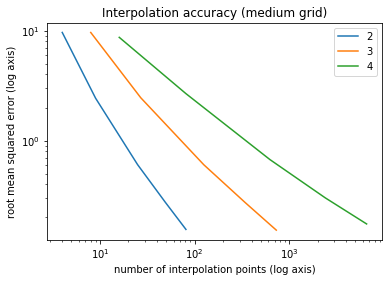

In [8]:
# plot results
plot_results(results_borehole_linear, params_borehole_linear)

* Zhou function

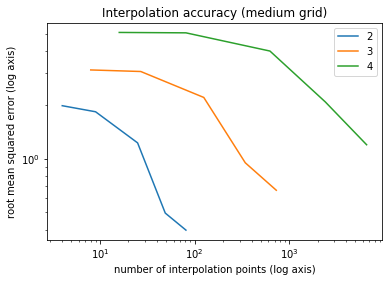

In [9]:
# plot results
plot_results(results_zhou_linear, params_zhou_linear)

Not surprisingly, interpolation accuracy increases with the density of the interpolation grid. Clearly, runtimes increase when adding more points in the construction of the interpolator

In [10]:
# print runtimes
print("runtimes borehole:")
print(results_borehole_linear["runtime"])
print("runtimes zhou:")
print(results_zhou_linear["runtime"])

runtimes borehole:
{2: array([0.        , 0.        , 0.01561832, 0.        , 0.01562285]), 3: array([0.01558638, 0.        , 0.01565599, 0.04686284, 0.11073375]), 4: array([0.01562881, 0.01558065, 0.26559663, 1.52420163, 6.74072623])}
runtimes zhou:
{2: array([0.00897717, 0.00801158, 0.00698137, 0.00794244, 0.00798202]), 3: array([0.00994182, 0.01000714, 0.01893926, 0.04690576, 0.10768032]), 4: array([0.01492763, 0.02792311, 0.28826308, 1.66436839, 6.95953488])}


### The 2D case - visualization of the effect of grid density on interpolation accuracy

The accuracy of the interpolation is depicted in the following series of graphs: starting with only  the corners of the state space, the density of the interpolation grid is increased from iteration to iteration.

* Borehole:

iteration: 0
grid method: regular
total number of interpolation points: 4
runtime for interpolation: 0.0
root mean squared error: 9.637129019432937


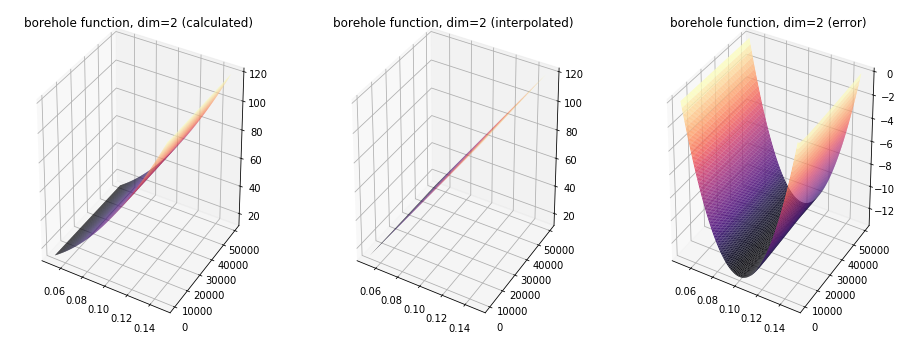

-------------------------------------------------------------------
iteration: 1
grid method: regular
total number of interpolation points: 9
runtime for interpolation: 0.010092496871948242
root mean squared error: 2.4308371313073627


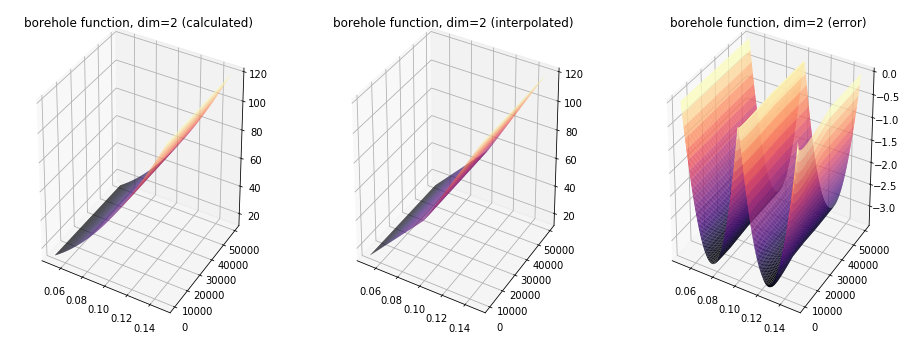

-------------------------------------------------------------------
iteration: 2
grid method: regular
total number of interpolation points: 25
runtime for interpolation: 0.014581918716430664
root mean squared error: 0.6046397407878752


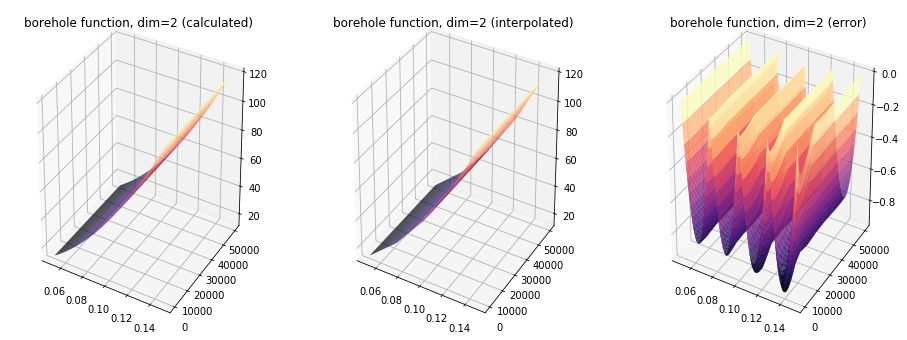

-------------------------------------------------------------------
iteration: 3
grid method: regular
total number of interpolation points: 49
runtime for interpolation: 0.018929481506347656
root mean squared error: 0.2752363715653587


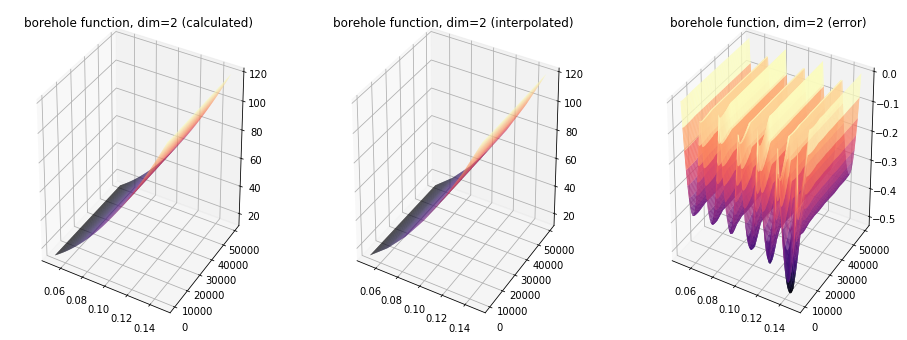

-------------------------------------------------------------------
iteration: 4
grid method: regular
total number of interpolation points: 81
runtime for interpolation: 0.010372161865234375
root mean squared error: 0.15569940788915038


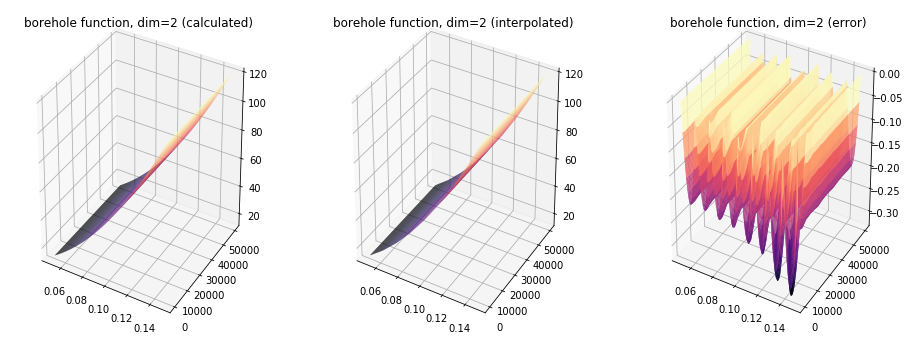

-------------------------------------------------------------------
iteration: 5
grid method: regular
total number of interpolation points: 121
runtime for interpolation: 0.02447366714477539
root mean squared error: 0.0998954247645737


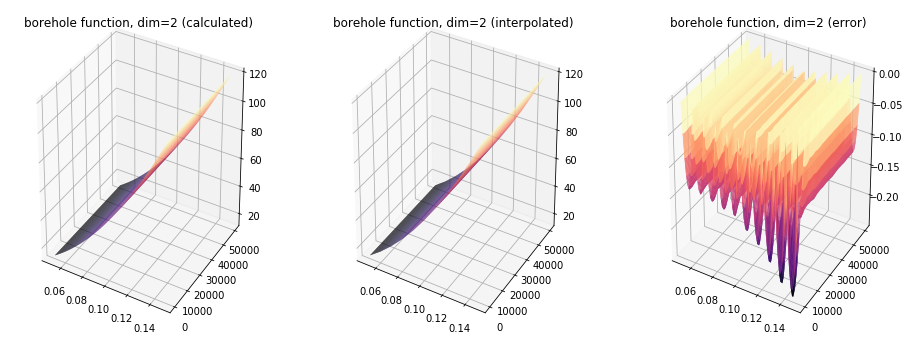

-------------------------------------------------------------------


In [11]:
# borehole function
iterations = [0, 1, 2, 3, 4, 5]

for iteration in iterations:
    print(f"iteration: {iteration}")
    compare_fit_2d_iter(params_borehole_linear, interp_params_borehole_linear, iteration)

iteration: 0
grid method: regular
total number of interpolation points: 4
runtime for interpolation: 0.009800434112548828
root mean squared error: 1.9751962194798462


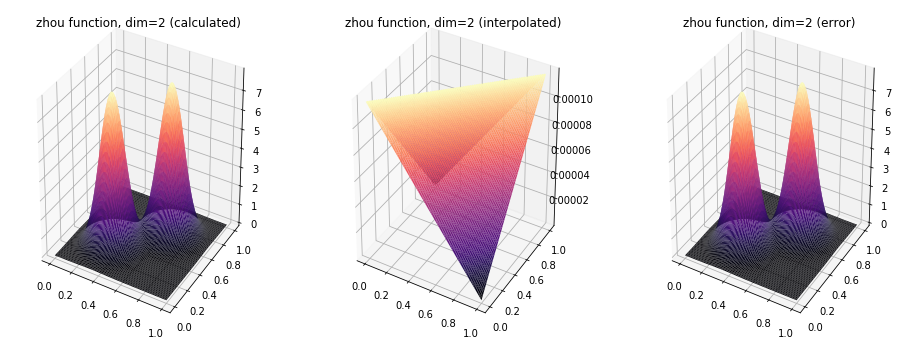

-------------------------------------------------------------------
iteration: 1
grid method: regular
total number of interpolation points: 9
runtime for interpolation: 0.014809131622314453
root mean squared error: 1.826823125714936


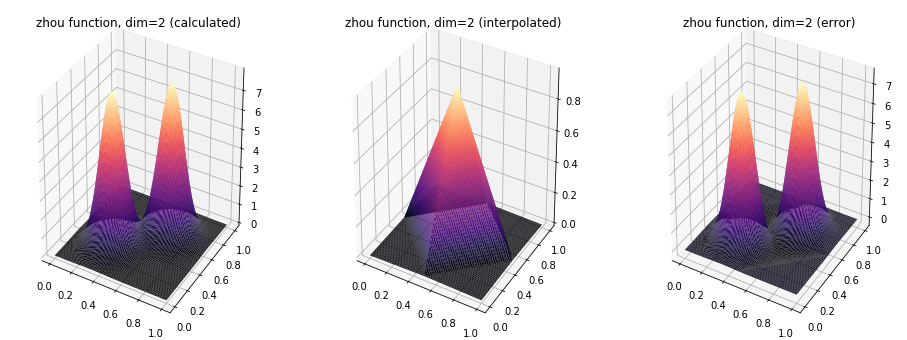

-------------------------------------------------------------------
iteration: 2
grid method: regular
total number of interpolation points: 25
runtime for interpolation: 0.0
root mean squared error: 1.2245353506751067


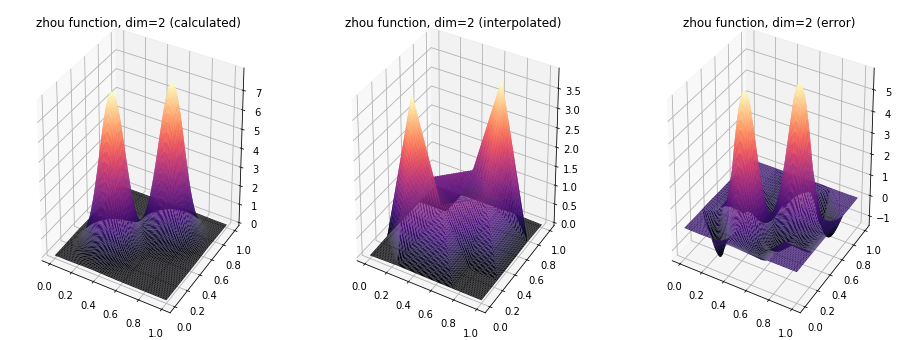

-------------------------------------------------------------------
iteration: 3
grid method: regular
total number of interpolation points: 49
runtime for interpolation: 0.02097487449645996
root mean squared error: 0.4961820465494429


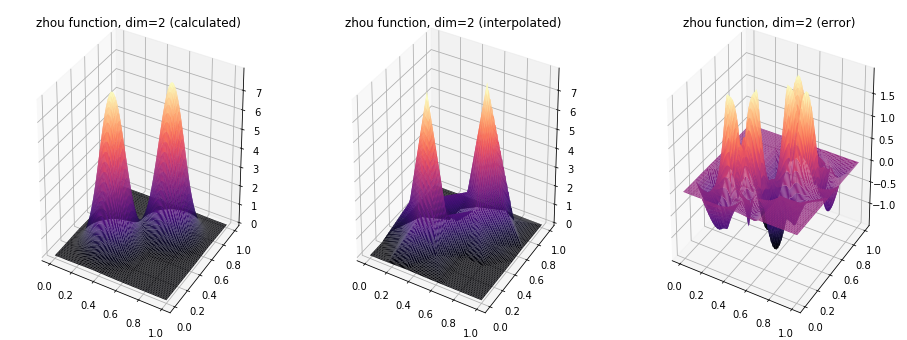

-------------------------------------------------------------------
iteration: 4
grid method: regular
total number of interpolation points: 81
runtime for interpolation: 0.021034955978393555
root mean squared error: 0.3985551304867043


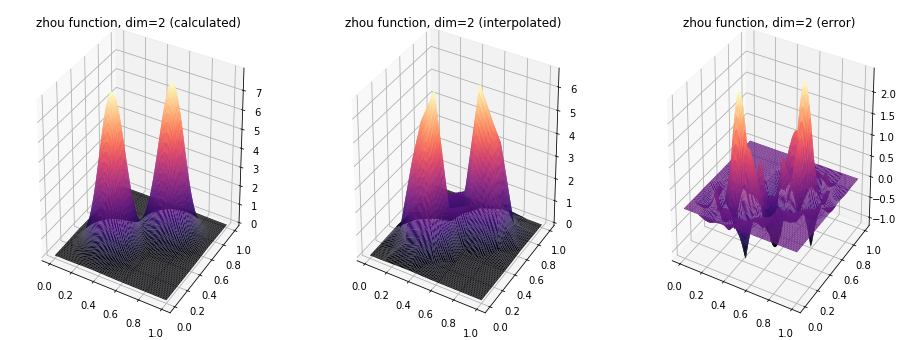

-------------------------------------------------------------------
iteration: 5
grid method: regular
total number of interpolation points: 121
runtime for interpolation: 0.010341644287109375
root mean squared error: 0.25605569126473693


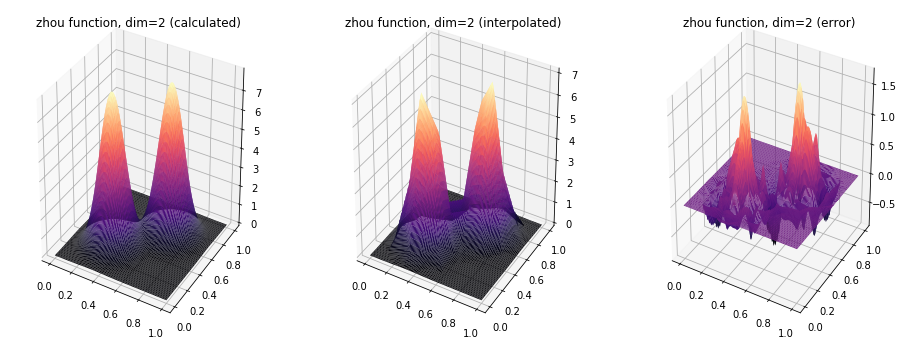

-------------------------------------------------------------------


In [12]:
# zhou function
iterations = [0, 1, 2, 3, 4, 5]

for iteration in iterations:
    print(f"iteration: {iteration}")
    compare_fit_2d_iter(params_zhou_linear, interp_params_zhou_linear, iteration)


As can be seen from the graphs, the more linear borehole function allows for high-accuracy interpolation with a limited number of interpolation points, whereas the more non-linear Zhou function requires substantially more interpolation points for a decent quality of the approximation.

# Alternative methods

Next, a number of alternative interpolation methods is considered. There exists a variety of free packages that implement various interpolation routines. Here, two packages are used for demonstration:
* <strong>dolo</strong>: dolo is a high performance numerical toolbox available via econforge (https://github.com/EconForge/dolo). Here, the following options are used: 
    - multi-dimensional spline interpolation in an arbitrary dimension with regular grids
    - multi-dimensional sparse interpolation in an arbitrary dimension with cosine basis functions (Chebychev / Smolyak interpolation) on sparse grids with level / depth $1$, $2$, or $3$
* <strong>sparsegrid</strong>: an implementation of sparse grid algorithm for solving integration and interpolation problems in d-dim spaces with far fewer function evaluations than needed with traditional tensor production integration / interpolation, written by Morgan Fouesneau (https://github.com/mfouesneau/sparsegrid). The package is mainly intended as sandbox for testing sparse grid applications and is not (yet) optimized for computing times. It features the following options 
    - 3D sparse interpolation in with piece-wise linear basis functions (Clenshaw-Curtis interpolation) on sparse grids with arbitraty level / depth
    - 3D sparse interpolation in with cosine basis functions (Chebychev / Smolyak interpolation) on sparse grids with arbitraty level / depth

## Spline interpolation

In [13]:
# create instance for study parameters
params_spline = copy.deepcopy(params_default)
params_spline["controls"]["interpolation method"] = "spline"
params_spline["controls"]["grid_method"] = "regular"
params_spline["controls"]["evaluate off-grid"] = "True"
params_spline["controls"]["iterations"] = 5
params_spline["controls"]["grid density"] = "medium"

# avoid memory errors in CI build check
try: 
    if os.environ['TRAVIS']:
        params_spline["controls"]["dims"] = [2, 3]
except:
    params_spline["controls"]["dims"] = [2, 3, 4]

# create instance for interpolation parameters
interp_params_spline = copy.deepcopy(interp_params)

# create instance for zhou function
params_zhou_spline = copy.deepcopy(params_spline)
params_zhou_spline["controls"]["function to approximate"] = "zhou_vectorize"

# create instance for borehole function
params_borehole_spline = copy.deepcopy(params_spline)
params_borehole_spline["controls"]["function to approximate"] = "borehole_wrapper_vectorize"

In [14]:
results_zhou_spline = execute_study(params_zhou_spline, interp_params_spline)
results_borehole_spline = execute_study(params_borehole_spline, interp_params_spline)

### the 2D case

* Borehole function

iteration: 0
grid method: regular
total number of interpolation points: 4
runtime for interpolation: 2.5554277896881104
root mean squared error: 9.684316660829811


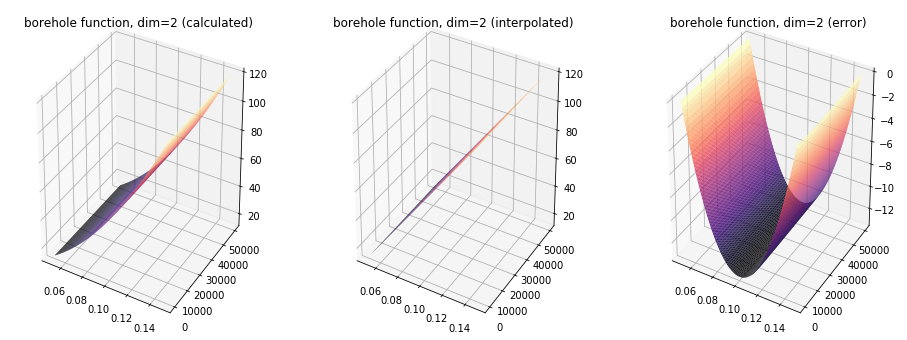

-------------------------------------------------------------------
iteration: 1
grid method: regular
total number of interpolation points: 9
runtime for interpolation: 0.0
root mean squared error: 0.6512402454550681


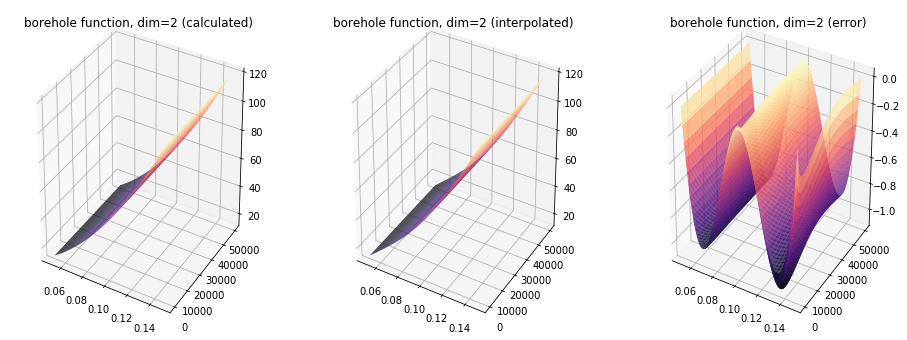

-------------------------------------------------------------------
iteration: 2
grid method: regular
total number of interpolation points: 25
runtime for interpolation: 0.0
root mean squared error: 0.16222853172849347


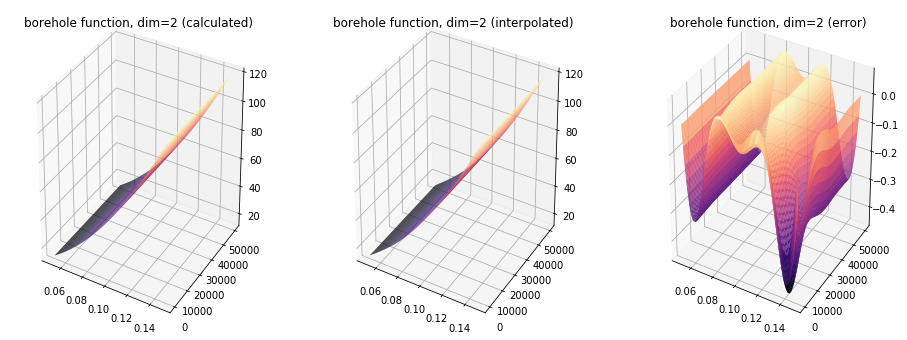

-------------------------------------------------------------------
iteration: 3
grid method: regular
total number of interpolation points: 49
runtime for interpolation: 0.0
root mean squared error: 0.0639886304795446


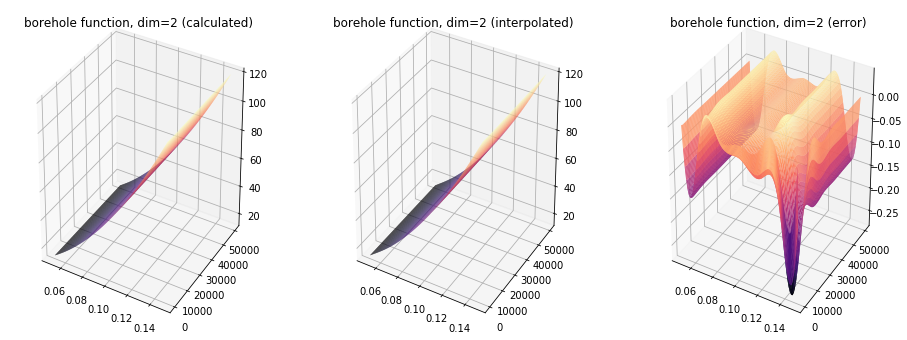

-------------------------------------------------------------------
iteration: 4
grid method: regular
total number of interpolation points: 81
runtime for interpolation: 0.0
root mean squared error: 0.03369723258058181


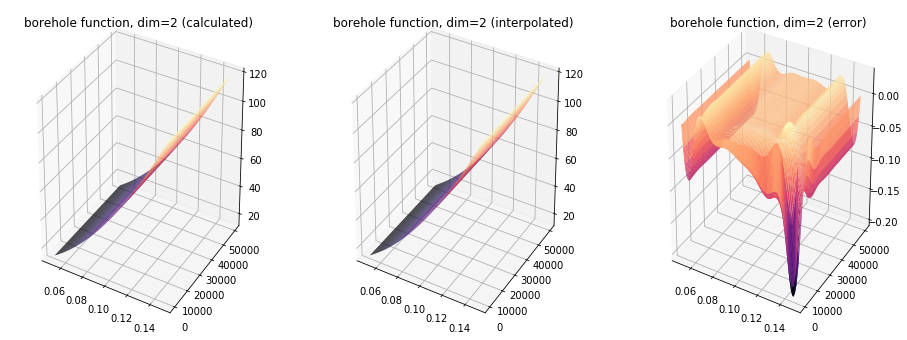

-------------------------------------------------------------------
iteration: 5
grid method: regular
total number of interpolation points: 121
runtime for interpolation: 0.0
root mean squared error: 0.02119472976382872


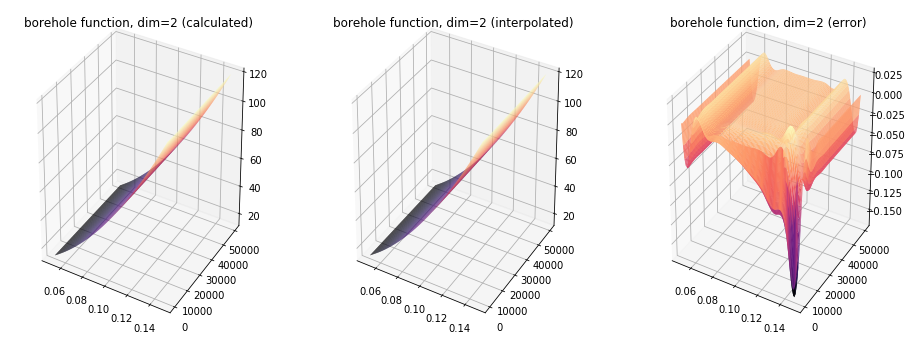

-------------------------------------------------------------------


In [15]:
iterations = [0, 1, 2, 3, 4, 5]

for iteration in iterations:
    print(f"iteration: {iteration}")
    compare_fit_2d_iter(params_borehole_spline, interp_params_spline, iteration)

* Zhou function

iteration: 0
grid method: regular
total number of interpolation points: 4
runtime for interpolation: 0.0035066604614257812
root mean squared error: 1.9752153045094114


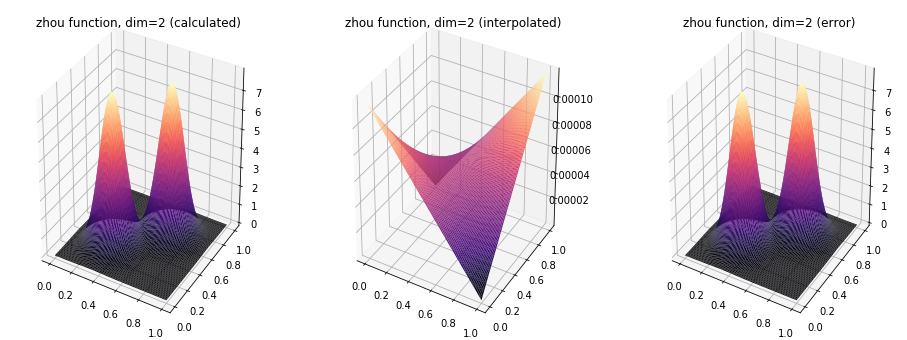

-------------------------------------------------------------------
iteration: 1
grid method: regular
total number of interpolation points: 9
runtime for interpolation: 0.015595197677612305
root mean squared error: 1.6928364572226835


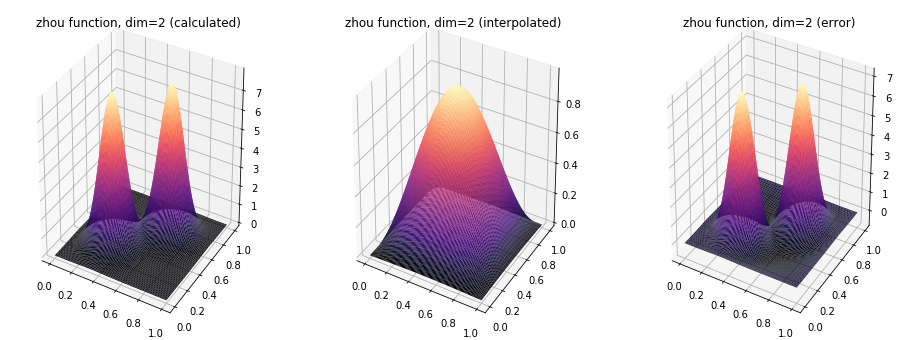

-------------------------------------------------------------------
iteration: 2
grid method: regular
total number of interpolation points: 25
runtime for interpolation: 0.0
root mean squared error: 1.156414578623518


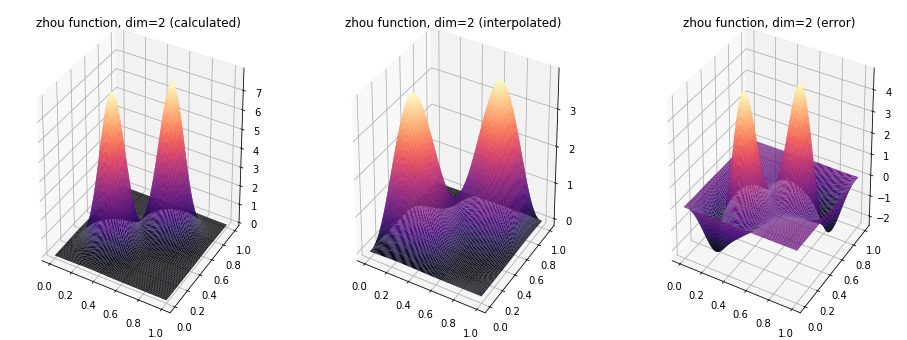

-------------------------------------------------------------------
iteration: 3
grid method: regular
total number of interpolation points: 49
runtime for interpolation: 0.0
root mean squared error: 0.050007844188242244


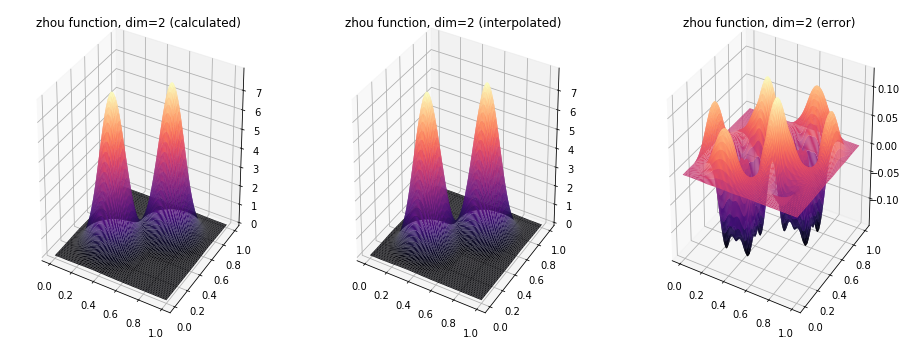

-------------------------------------------------------------------
iteration: 4
grid method: regular
total number of interpolation points: 81
runtime for interpolation: 0.015622138977050781
root mean squared error: 0.12079856294857587


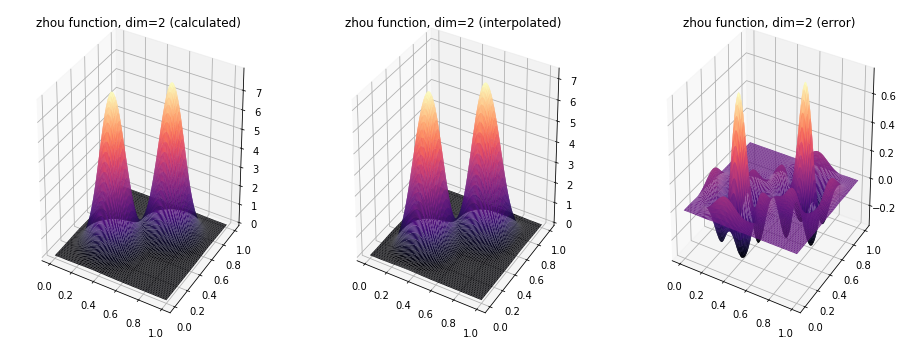

-------------------------------------------------------------------
iteration: 5
grid method: regular
total number of interpolation points: 121
runtime for interpolation: 0.0
root mean squared error: 0.035804660027256574


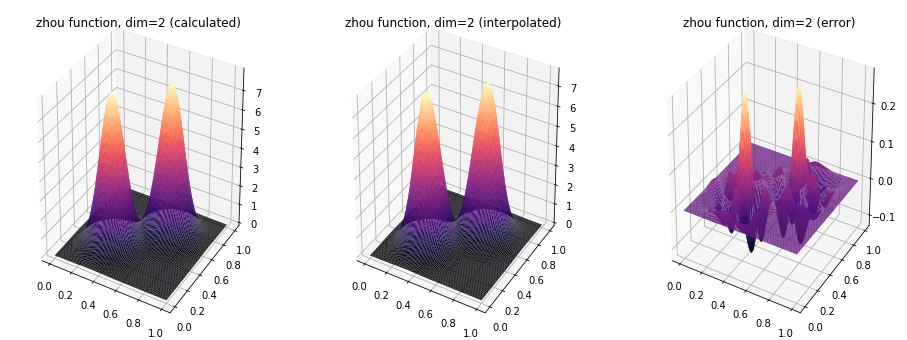

-------------------------------------------------------------------


In [16]:
iterations = [0, 1, 2, 3, 4, 5]

for iteration in iterations:
    print(f"iteration: {iteration}")
    compare_fit_2d_iter(params_zhou_spline, interp_params_spline, iteration)

### Higher dimensions

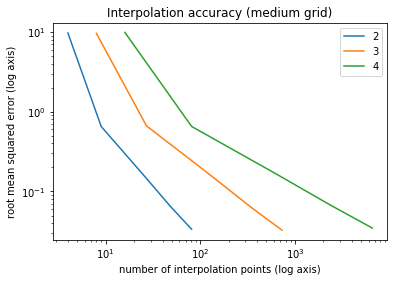

In [17]:
# plot results
plot_results(results_borehole_spline, params_borehole_spline)

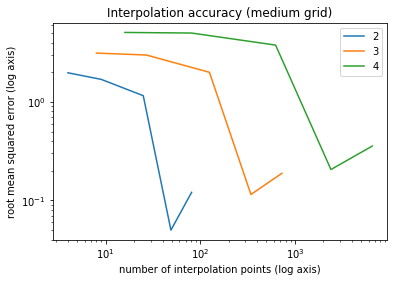

In [18]:
# plot results
plot_results(results_zhou_spline, params_zhou_spline)

## Sparse grid methods

### Clenshaw-Curtis

In [19]:
# create instance for study parameters
params_sparse_cc = copy.deepcopy(params_default)
params_sparse_cc["controls"]["interpolation method"] = "sparse"
params_sparse_cc["controls"]["grid_method"] = "sparse"
params_sparse_cc["controls"]["evaluate off-grid"] = "True"
params_sparse_cc["controls"]["iterations"] = 5
params_sparse_cc["controls"]["grid density"] = "medium"

# this implementation only works for dim <= 2
params_sparse_cc["controls"]["dims"] = [2]

# create instance for interpolation parameters
interp_params_sparse_cc = copy.deepcopy(interp_params)
interp_params_sparse_cc["sparse"]["polynomial family"] = "CC"


# create instance for zhou function
params_zhou_sparse_cc = copy.deepcopy(params_sparse_cc)
params_zhou_sparse_cc["controls"]["function to approximate"] = "zhou_vectorize"

# create instance for borehole function
params_borehole_sparse_cc = copy.deepcopy(params_sparse_cc)
params_borehole_sparse_cc["controls"]["function to approximate"] = "borehole_wrapper_vectorize"

In [20]:
results_zhou_sparse_cc = execute_study(params_zhou_sparse_cc, interp_params_sparse_cc)
results_borehole_sparse_cc = execute_study(params_borehole_sparse_cc, interp_params_sparse_cc)

### The 2D case

* Borehole function

iteration: 0
grid method: regular
total number of interpolation points: 5
runtime for interpolation: 1.1306557655334473
root mean squared error: 1.8574489676572299


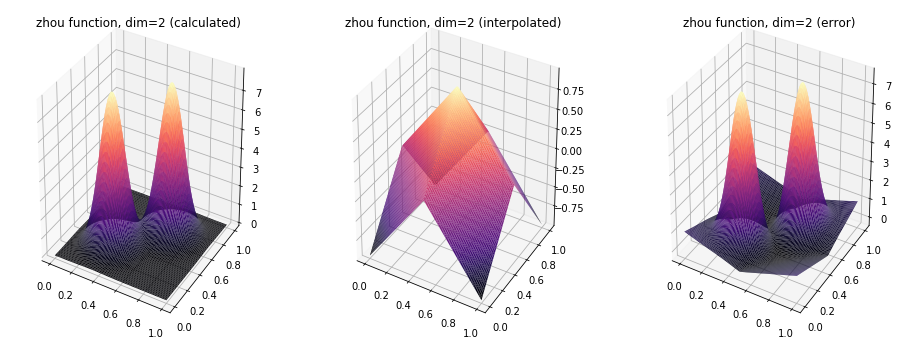

-------------------------------------------------------------------
iteration: 1
grid method: regular
total number of interpolation points: 13
runtime for interpolation: 4.705788850784302
root mean squared error: 1.5801514212334968


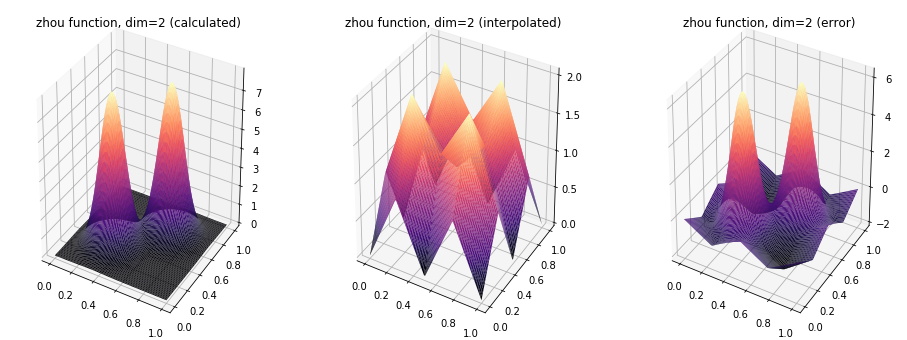

-------------------------------------------------------------------
iteration: 2
grid method: regular
total number of interpolation points: 29
runtime for interpolation: 13.065898656845093
root mean squared error: 1.4243901260811693


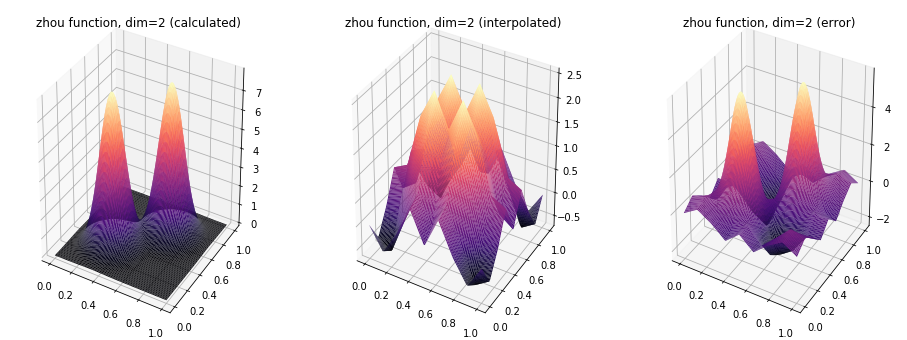

-------------------------------------------------------------------
iteration: 3
grid method: regular
total number of interpolation points: 65
runtime for interpolation: 32.763044595718384
root mean squared error: 1.0047988238836818


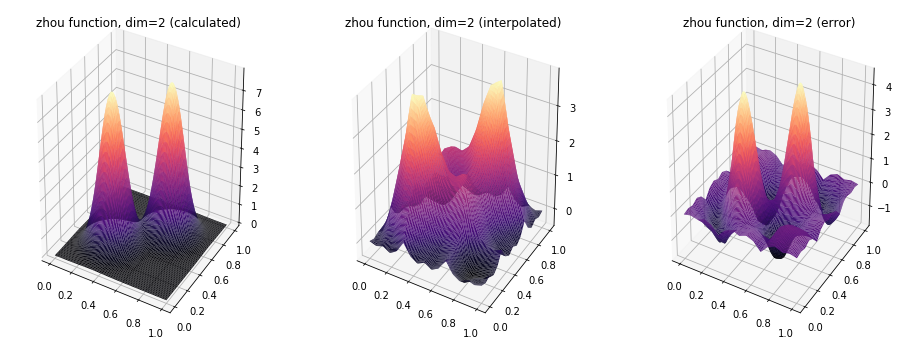

-------------------------------------------------------------------
iteration: 4
grid method: regular
total number of interpolation points: 145
runtime for interpolation: 76.61011695861816
root mean squared error: 0.4956595504905783


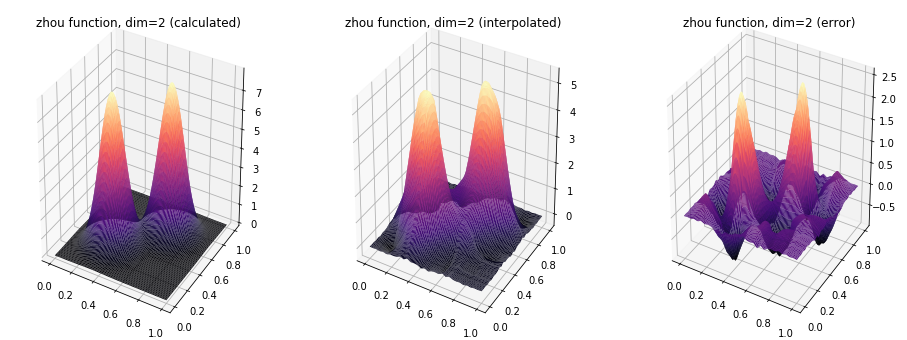

-------------------------------------------------------------------
iteration: 5
grid method: regular
total number of interpolation points: 321
runtime for interpolation: 178.45495748519897
root mean squared error: 0.19419247078896415


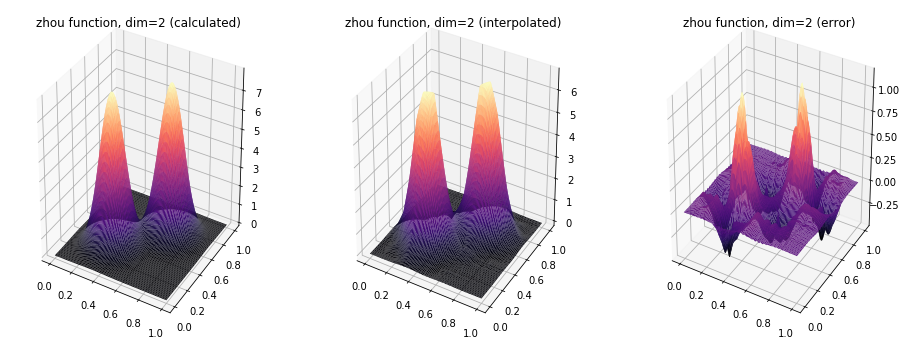

-------------------------------------------------------------------


In [21]:
iterations = [0, 1, 2, 3, 4, 5]

for iteration in iterations:
    print(f"iteration: {iteration}")
    compare_fit_2d_iter(params_zhou_sparse_cc, interp_params_sparse_cc, iteration)

* Zhou function

iteration: 0
grid method: regular
total number of interpolation points: 5
runtime for interpolation: 1.096790075302124
root mean squared error: 1.8574489676572299


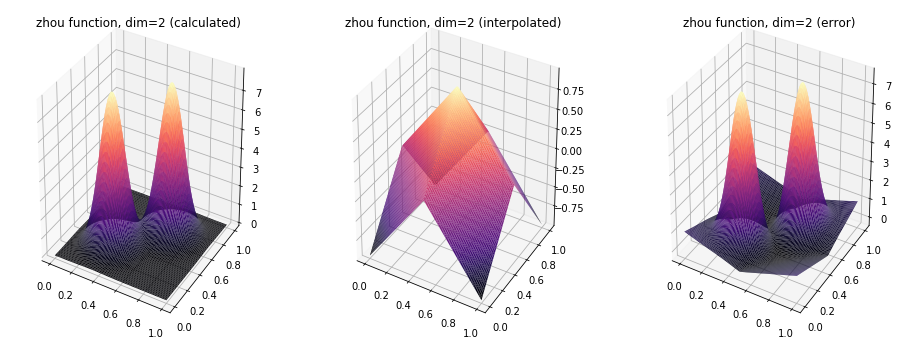

-------------------------------------------------------------------
iteration: 1
grid method: regular
total number of interpolation points: 13
runtime for interpolation: 4.580292463302612
root mean squared error: 1.5801514212334968


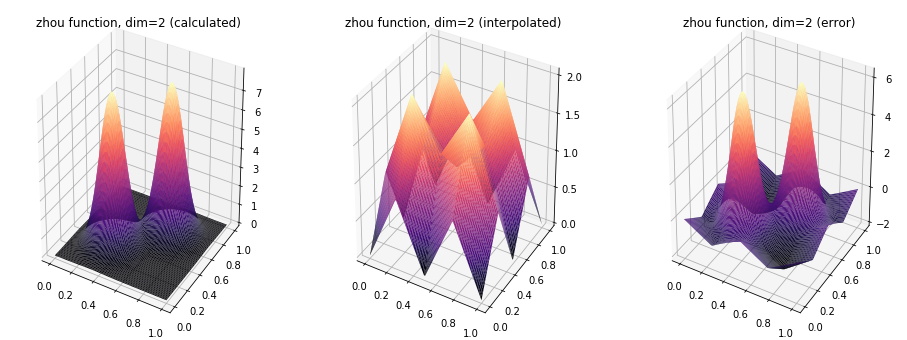

-------------------------------------------------------------------
iteration: 2
grid method: regular
total number of interpolation points: 29
runtime for interpolation: 13.169901132583618
root mean squared error: 1.4243901260811693


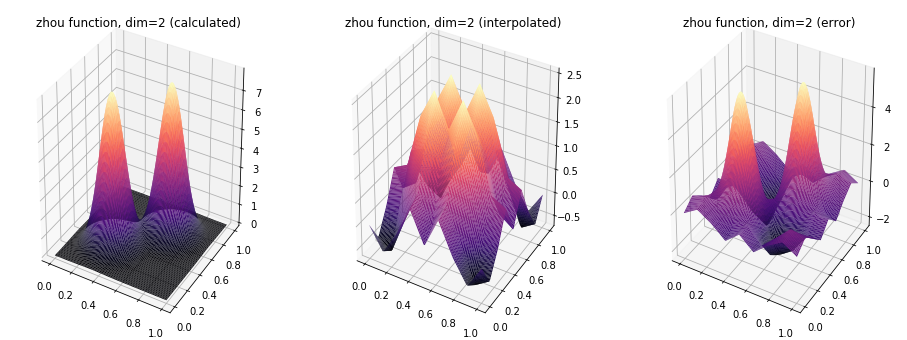

-------------------------------------------------------------------
iteration: 3
grid method: regular
total number of interpolation points: 65
runtime for interpolation: 32.335795402526855
root mean squared error: 1.0047988238836818


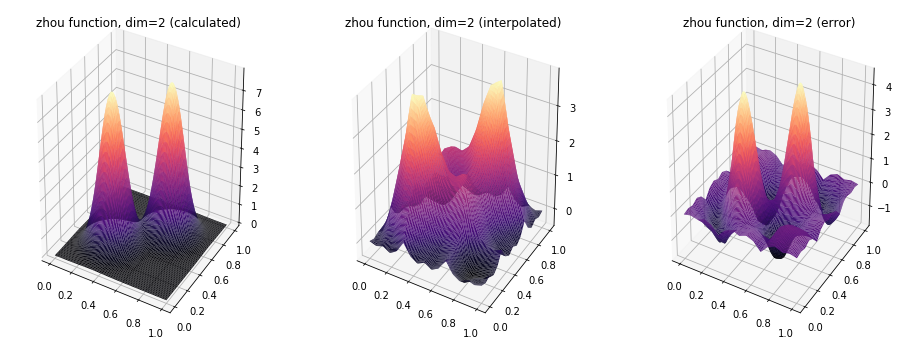

-------------------------------------------------------------------
iteration: 4
grid method: regular
total number of interpolation points: 145
runtime for interpolation: 75.67256379127502
root mean squared error: 0.4956595504905783


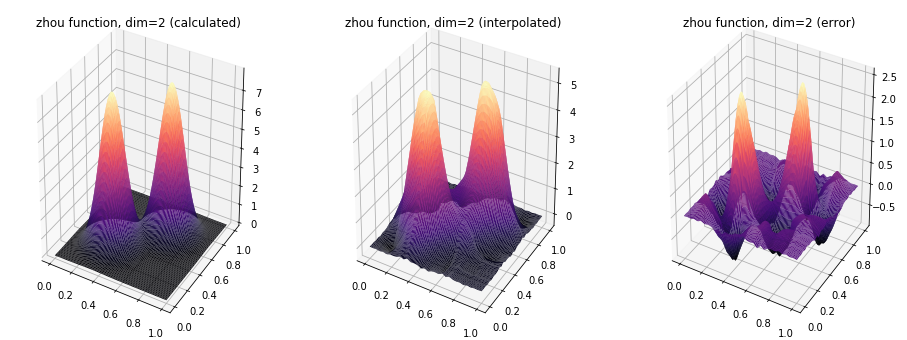

-------------------------------------------------------------------
iteration: 5
grid method: regular
total number of interpolation points: 321
runtime for interpolation: 177.18913769721985
root mean squared error: 0.19419247078896415


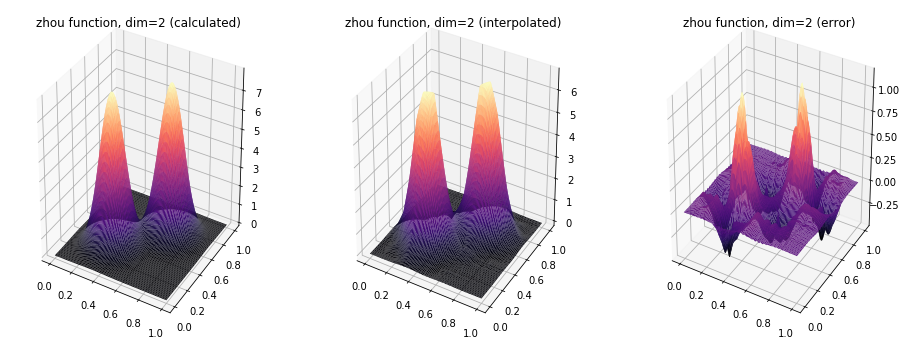

-------------------------------------------------------------------


In [22]:
iterations = [0, 1, 2, 3, 4, 5]

for iteration in iterations:
    print(f"iteration: {iteration}")
    compare_fit_2d_iter(params_zhou_sparse_cc, interp_params_sparse_cc, iteration)

### Smolyak

For the final method I tested, I again used the dolo package. The interpolator used here is dolo.numeric.interpolation.smolyak. 

In [23]:
# create instance for study parameters
params_sparse_ch = copy.deepcopy(params_default)
params_sparse_ch["controls"]["interpolation method"] = "sparse"
params_sparse_ch["controls"]["grid_method"] = "sparse"
params_sparse_ch["controls"]["evaluate off-grid"] = "True"
params_sparse_ch["controls"]["iterations"] = 3
params_sparse_ch["controls"]["grid density"] = "medium"

# this implementation only works for dim <= 2
params_sparse_ch["controls"]["dims"] = [2]

# create instance for interpolation parameters
interp_params_sparse_ch = copy.deepcopy(interp_params)
interp_params_sparse_ch["sparse"]["polynomial family"] = "CH"

# create instance for zhou function
params_zhou_sparse_ch = copy.deepcopy(params_sparse_ch)
params_zhou_sparse_ch["controls"]["function to approximate"] = "zhou_vectorize"

# create instance for borehole function
params_borehole_sparse_ch = copy.deepcopy(params_sparse_ch)
params_borehole_sparse_ch["controls"]["function to approximate"] = "borehole_wrapper_vectorize"

In [24]:
results_zhou_sparse_ch = execute_study(params_zhou_sparse_ch, interp_params_sparse_ch)
results_borehole_sparse_ch = execute_study(params_borehole_sparse_ch, interp_params_sparse_ch)

### The 2D case

* Borehole function

iteration: 0
grid method: regular
total number of interpolation points: 5
runtime for interpolation: 6.44625997543335
root mean squared error: 0.043687533392512946


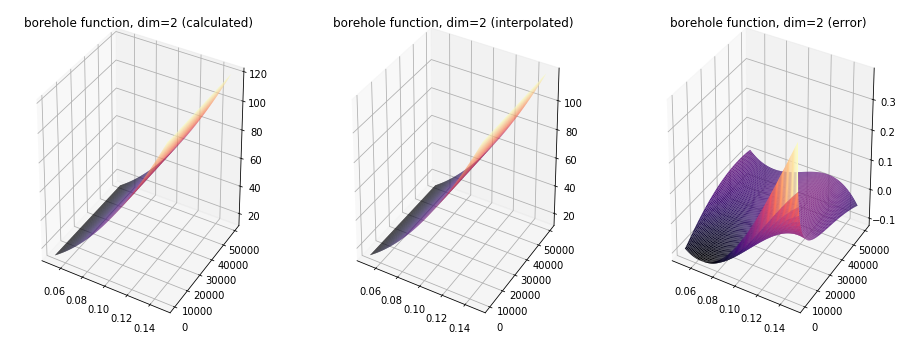

-------------------------------------------------------------------
iteration: 1
grid method: regular
total number of interpolation points: 13
runtime for interpolation: 36.78475260734558
root mean squared error: 977.2704270111137


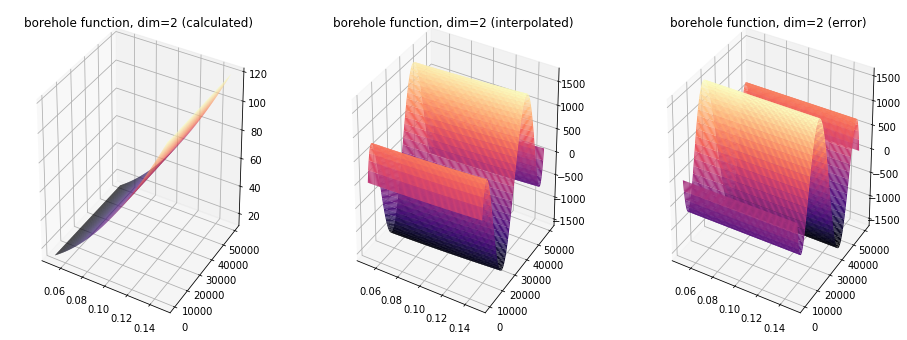

-------------------------------------------------------------------
iteration: 2
grid method: regular
total number of interpolation points: 29
runtime for interpolation: 140.3717222213745
root mean squared error: 264178908.47474056


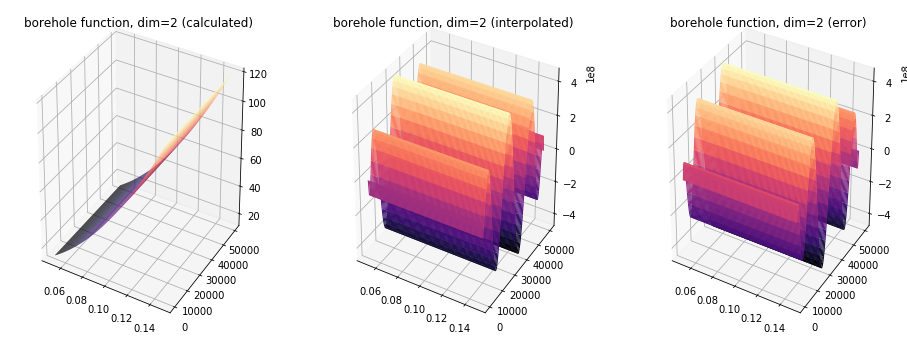

-------------------------------------------------------------------
iteration: 3
grid method: regular
total number of interpolation points: 65
runtime for interpolation: 525.4999043941498
root mean squared error: 153135112374.38486


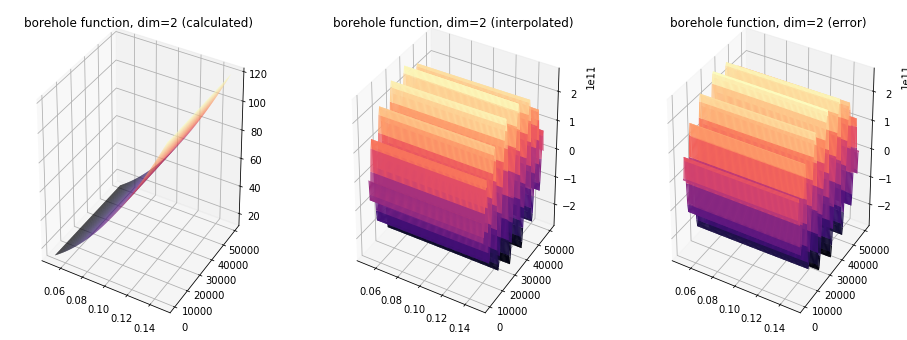

-------------------------------------------------------------------
iteration: 4
grid method: regular
total number of interpolation points: 145
runtime for interpolation: 1891.434420824051
root mean squared error: 2902493520537786.0


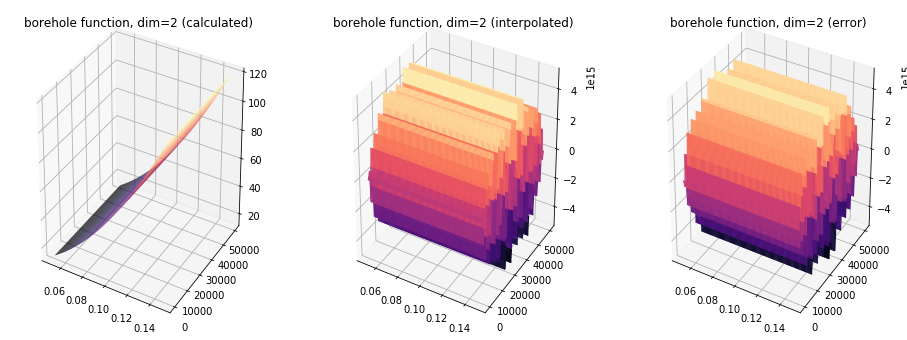

-------------------------------------------------------------------
iteration: 5
grid method: regular
total number of interpolation points: 321
runtime for interpolation: 7271.039892196655
root mean squared error: 4.514358529994332e+20


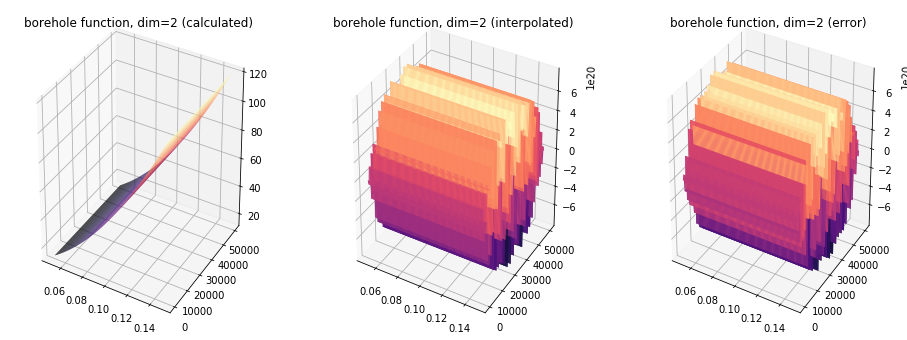

-------------------------------------------------------------------


In [25]:
iterations = [0, 1, 2, 3, 4, 5]

for iteration in iterations:
    print(f"iteration: {iteration}")
    compare_fit_2d_iter(params_borehole_sparse_ch, interp_params_sparse_ch, iteration)

* Zhou function

iteration: 0
grid method: regular
total number of interpolation points: 5
runtime for interpolation: 6.593949556350708
root mean squared error: 1.6858871505140047


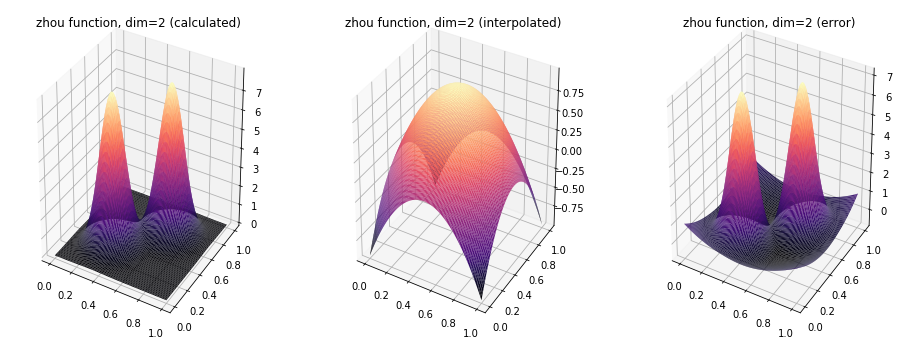

-------------------------------------------------------------------
iteration: 1
grid method: regular
total number of interpolation points: 13
runtime for interpolation: 36.3298602104187
root mean squared error: 1.7200857001417098


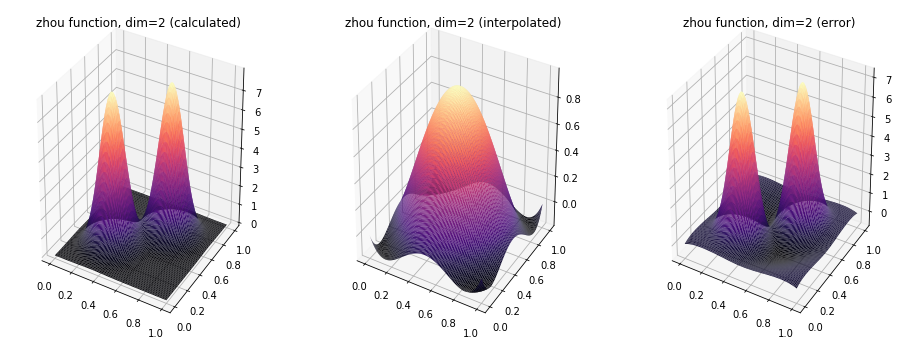

-------------------------------------------------------------------
iteration: 2
grid method: regular
total number of interpolation points: 29
runtime for interpolation: 140.07025933265686
root mean squared error: 1.4315450337366575


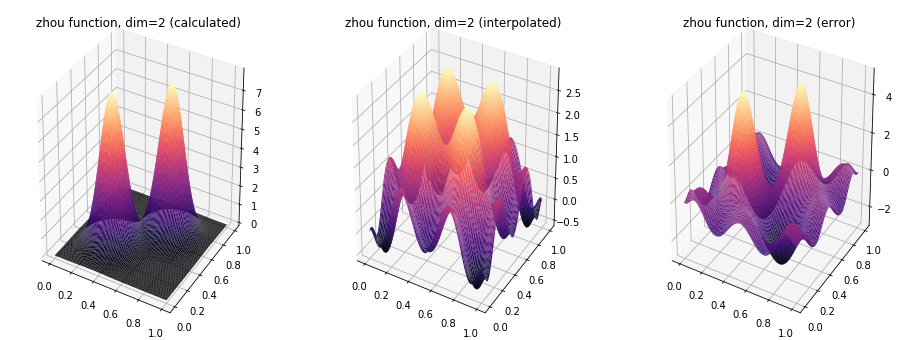

-------------------------------------------------------------------
iteration: 3
grid method: regular
total number of interpolation points: 65
runtime for interpolation: 522.1890785694122
root mean squared error: 1.3085588662415968


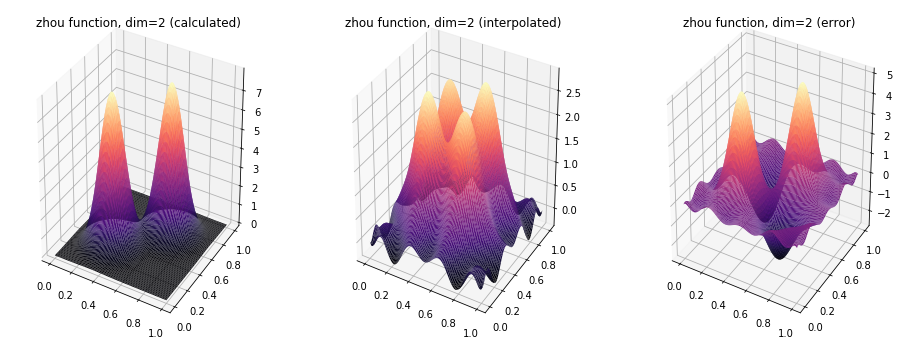

-------------------------------------------------------------------
iteration: 4
grid method: regular
total number of interpolation points: 145
runtime for interpolation: 1910.0895042419434
root mean squared error: 0.9584544098731653


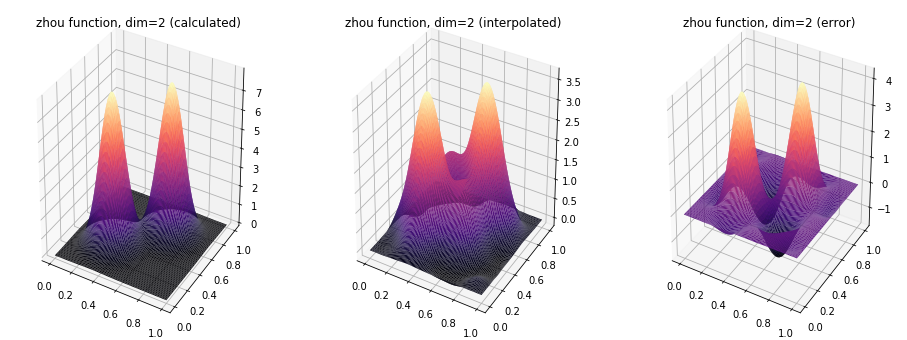

-------------------------------------------------------------------
iteration: 5
grid method: regular
total number of interpolation points: 321
runtime for interpolation: 7152.345985174179
root mean squared error: 0.17263666764063862


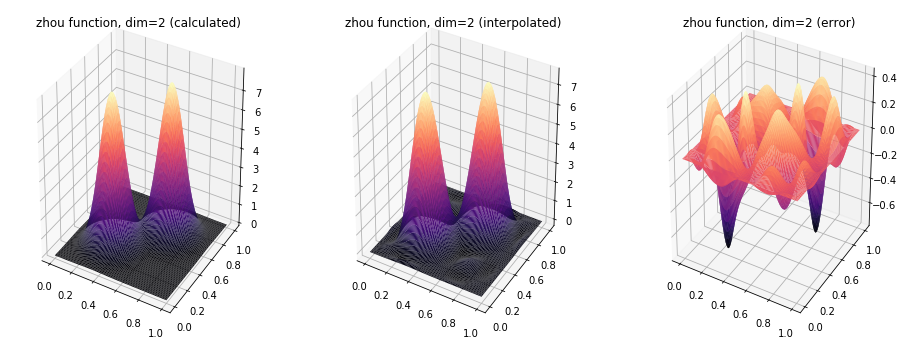

-------------------------------------------------------------------


In [26]:
iterations = [0, 1, 2, 3, 4, 5]

for iteration in iterations:
    print(f"iteration: {iteration}")
    compare_fit_2d_iter(params_zhou_sparse_ch, interp_params_sparse_ch, iteration)

## Smolyak (dolo implementation)

The dolo package also contains an implementation of the Smolyak sparse grid method. While this implementation is limited to the sparse grid levels $l \in [1, 2, 3]$, the method is implemented efficiently, resulting in drastically faster computation, effectively allowing the method to be applied to functions with higher dimensionality. To illustrate that the dolo implementation obtains the same result as the implementation demonstrated above, we re-run the above analysis and observe that computation times are substantially lower. 

In [27]:
# create instance for linear regular parametrization and set parameters
params_sparse_dolo = copy.deepcopy(params_default)
params_sparse_dolo["controls"]["interpolation method"] = "smolyak"
params_sparse_dolo["controls"]["grid_method"] = "sparse"
params_sparse_dolo["controls"]["evaluate off-grid"] = "True"
params_sparse_dolo["controls"]["iterations"] = 3
params_sparse_dolo["controls"]["grid density"] = "medium"

try: 
    if os.environ['TRAVIS']:
        params_sparse_dolo["controls"]["dims"] = [2, 3]
except:
    params_sparse_dolo["controls"]["dims"] = [2, 3, 4, 5, 6, 7, 8]

interp_params_sparse_dolo = copy.deepcopy(interp_params)


# create instance for zhou function
params_zhou_sparse_dolo = copy.deepcopy(params_sparse_dolo)
params_zhou_sparse_dolo["controls"]["function to approximate"] = "zhou_vectorize"

# create instance for borehole function
params_borehole_sparse_dolo = copy.deepcopy(params_sparse_dolo)
params_borehole_sparse_dolo["controls"]["function to approximate"] = "borehole_wrapper_vectorize"

In [28]:
results_zhou_sparse_dolo = execute_study(params_zhou_sparse_dolo, interp_params_sparse_dolo)
results_borehole_sparse_dolo = execute_study(params_borehole_sparse_dolo, interp_params_sparse_dolo)

### The 2D case

* Borehole function

iteration: 0
grid method: regular
total number of interpolation points: 5
runtime for interpolation: 0.0
root mean squared error: 0.04368753339251564


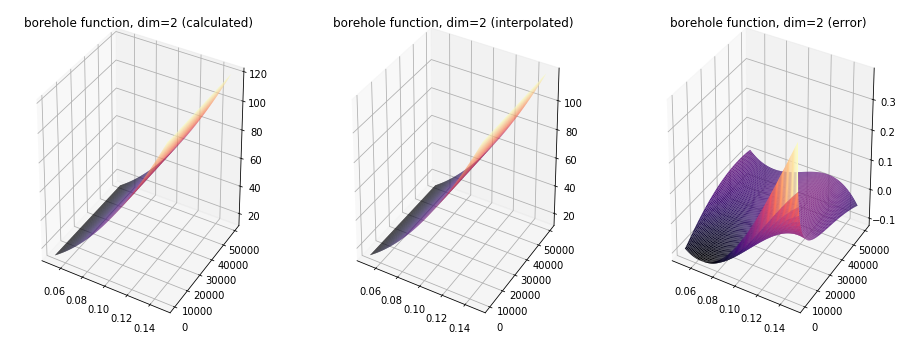

-------------------------------------------------------------------
iteration: 1
grid method: regular
total number of interpolation points: 13
runtime for interpolation: 0.015587568283081055
root mean squared error: 0.038663635093757254


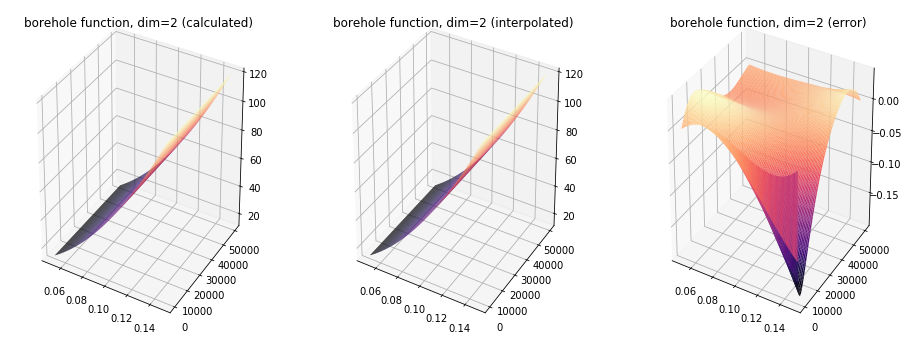

-------------------------------------------------------------------
iteration: 2
grid method: regular
total number of interpolation points: 29
runtime for interpolation: 0.0
root mean squared error: 0.014297237490566913


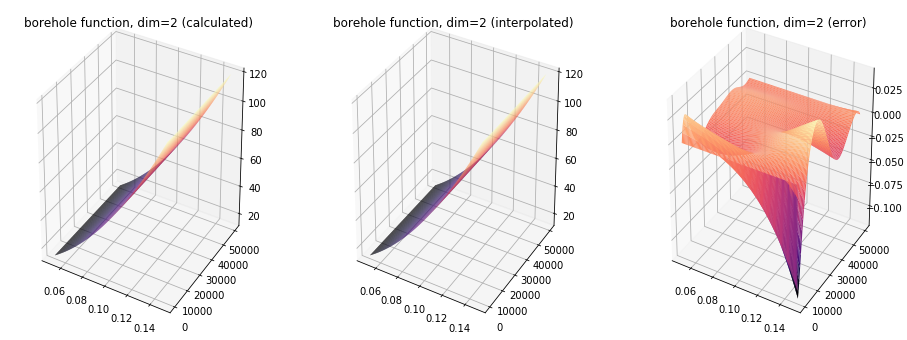

-------------------------------------------------------------------


In [29]:
iterations = [0, 1, 2]

for iteration in iterations:
    print(f"iteration: {iteration}")
    compare_fit_2d_iter(params_borehole_sparse_dolo, interp_params_sparse_dolo, iteration)


* Zhou function

iteration: 0
grid method: regular
total number of interpolation points: 5
runtime for interpolation: 0.0
root mean squared error: 1.6858871505140047


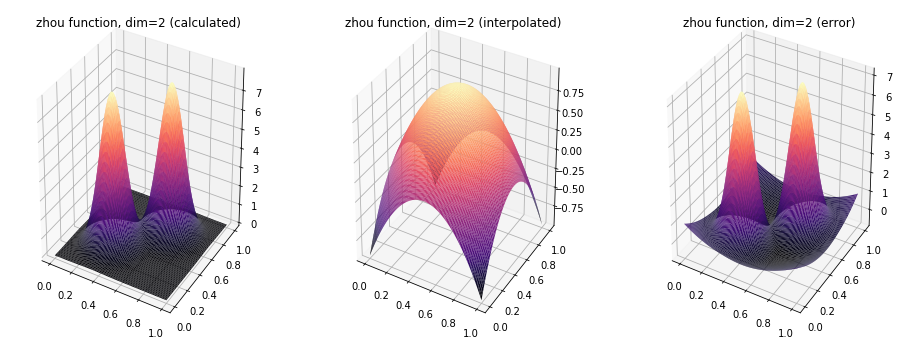

-------------------------------------------------------------------
iteration: 1
grid method: regular
total number of interpolation points: 13
runtime for interpolation: 0.0
root mean squared error: 1.7200906422390565


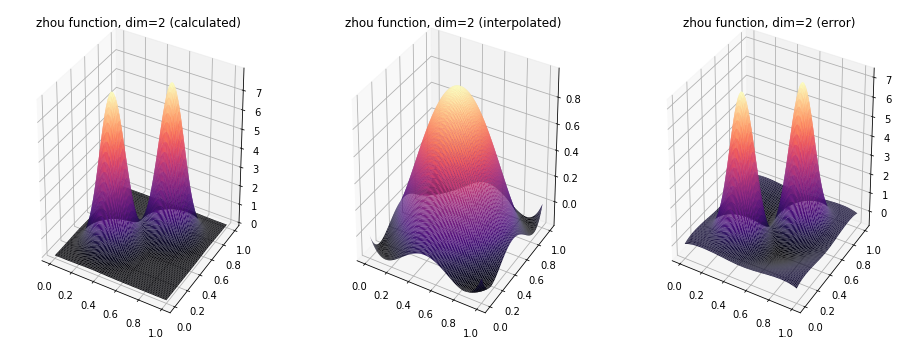

-------------------------------------------------------------------
iteration: 2
grid method: regular
total number of interpolation points: 29
runtime for interpolation: 0.015596151351928711
root mean squared error: 1.4315442351674423


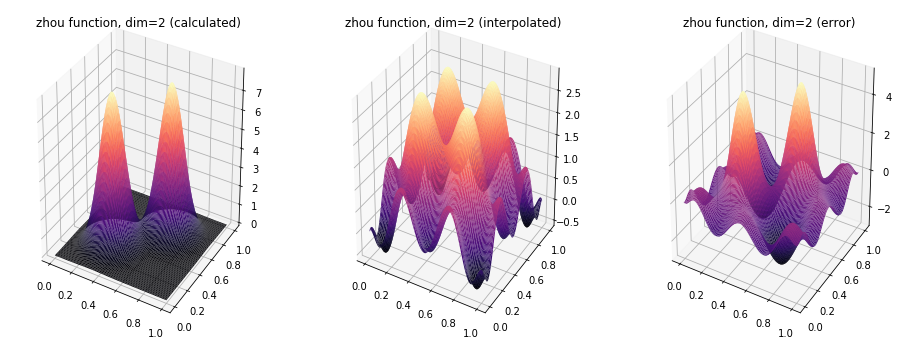

-------------------------------------------------------------------


In [30]:
iterations = [0, 1, 2]

for iteration in iterations:
    print(f"iteration: {iteration}")
    compare_fit_2d_iter(params_zhou_sparse_dolo, interp_params_sparse_dolo, iteration)


### Higher dimensions

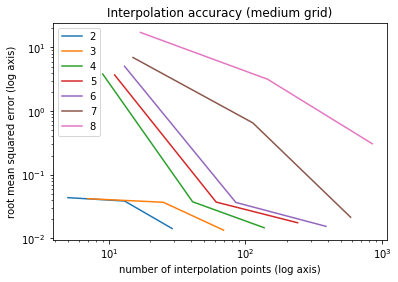

In [31]:
# plot results
plot_results(results_borehole_sparse_dolo, params_borehole_sparse_dolo)

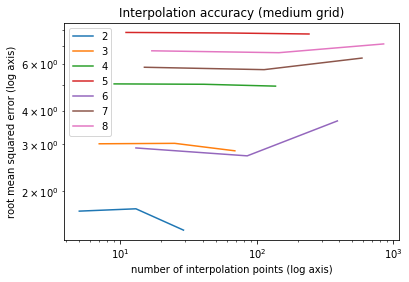

In [32]:
# plot results
plot_results(results_zhou_sparse_dolo, params_zhou_sparse_dolo)

What becomes apparent from the above charts is that while the maximum sparse grid level currently available with the dolo implementation achieves decent approximation of the borehole function irrespective of the dimension of the state space, the resulting grid is simply not fine enough to effectively capture the strong non-linearities of the Zhou function.

# Adaptations for discrete domains

One major drawback of many powerful interpolation methods such as sparse grid methods is that the grid is determined by the functional family used to construct the interpolant and by the bounds of the domain. 

One way to address this issue is to interpret the discrete variables as categorical variable and construct separate interpolators for the target function conditional on the value of the categorical variable. Suppose, for instance, a d-dimensional function where one variable can only take on the values $[0, 1, 2]$. Then, it would be possible to construct 3 separate (d-1)-dimensional interpolants for the target function given that the value of the discrete variable is $0$, $1$, or $2$, respectively. While inheriting the desirable properties of the sparse method for the conditional interpolants, this approach runs into issues if (i) the discrete variable can take on many values or (ii) more than one of the variables is discrete. In both cases, the number of conditional interpolants quickly becomes infeasibly large.

Another way to address the issue is to assume that the target function is not in fact not defined in between the possible realizations, but the data is such that only a finite set of realizations ever materializes. If, in addition, we assume that the target function is continuous "in between" the discrete realizations of the discrete variable, we can apply interpolation methods to approximate the function values at the sparse grid nodes that are "off-grid".

Clearly, an additional source of approximation error is introduced in doing so. Hence, there now is a trade-off between using a deeper sparse grid to increase the accuracy of the fit and adding error through more "local approximations" of off-grid function values for the sparse grid nodes.

To assess which effect dominates, I compare the approximation error obtained from first applying (local) linear interpolation to approximate function values and then using Smolyak sparse grid interpolation for different orders of the polynomial family (i.e. for different depths of the sparse grid).

In [43]:
# set parameters for off-grid evaluation
params_borehole_sparse_dolo_1stage = copy.deepcopy(params_borehole_sparse_dolo)
params_borehole_sparse_dolo_1stage["controls"]["dims"] = [2, 3, 4, 5]
params_borehole_sparse_dolo_1stage["controls"]["evaluate off-grid"] = "True"

# set parameters for on-grid interpolation
params_borehole_sparse_dolo_2stage = copy.deepcopy(params_borehole_sparse_dolo)
params_borehole_sparse_dolo_2stage["controls"]["dims"] = [2, 3, 4, 5]
params_borehole_sparse_dolo_2stage["controls"]["evaluate off-grid"] = "False"


# set parameters for off-grid evaluation
params_zhou_sparse_dolo_1stage = copy.deepcopy(params_zhou_sparse_dolo)
params_zhou_sparse_dolo_1stage["controls"]["dims"] = [2, 3, 4, 5]
params_zhou_sparse_dolo_1stage["controls"]["evaluate off-grid"] = "True"

# set parameters for on-grid interpolation
params_zhou_sparse_dolo_2stage = copy.deepcopy(params_zhou_sparse_dolo)
params_zhou_sparse_dolo_2stage["controls"]["dims"] = [2, 3, 4, 5]
params_zhou_sparse_dolo_2stage["controls"]["evaluate off-grid"] = "False"

In [44]:
# execute simulation
results_borehole_sparse_dolo_1stage = execute_study(params_borehole_sparse_dolo_1stage, interp_params_sparse_dolo)
results_borehole_sparse_dolo_2stage = execute_study(params_borehole_sparse_dolo_2stage, interp_params_sparse_dolo)

In [45]:
# execute simulation
results_zhou_sparse_dolo_1stage = execute_study(params_zhou_sparse_dolo_1stage, interp_params_sparse_dolo)
results_zhou_sparse_dolo_2stage = execute_study(params_zhou_sparse_dolo_2stage, interp_params_sparse_dolo)

### Results

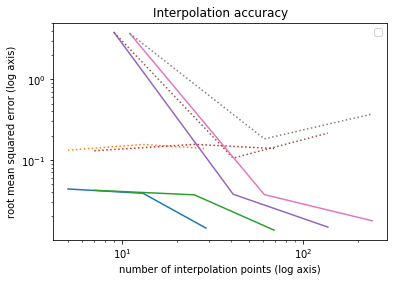

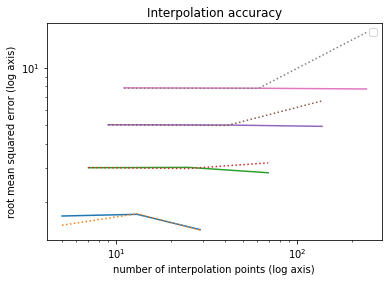

In [47]:
# plot results
compare_results(
    results_borehole_sparse_dolo_1stage, 
    results_borehole_sparse_dolo_2stage, 
    params_borehole_sparse_dolo_1stage, 
    params_borehole_sparse_dolo_2stage
)
# plot results
compare_results(
    results_zhou_sparse_dolo_1stage, 
    results_zhou_sparse_dolo_2stage, 
    params_zhou_sparse_dolo_1stage, 
    params_zhou_sparse_dolo_2stage
)

As can be seen from the graph, the additional error introduced through the first stage interpolation might outweigh the accuracy gain from adding layers / polynomials in the global interpolation. This effect is mainly driven by the accuracy of the first stage interpolation, which in turn depends on how far, on average, the interpolation nodes are from the global grid points. This can be observed by varying the density of the global grid:

In [48]:
params_borehole_sparse_dolo_1stage_lowdensity = copy.deepcopy(params_borehole_sparse_dolo_1stage)
params_borehole_sparse_dolo_2stage_lowdensity = copy.deepcopy(params_borehole_sparse_dolo_2stage)
params_borehole_sparse_dolo_1stage_highdensity = copy.deepcopy(params_borehole_sparse_dolo_1stage)
params_borehole_sparse_dolo_2stage_highdensity = copy.deepcopy(params_borehole_sparse_dolo_2stage)

params_borehole_sparse_dolo_1stage_lowdensity["controls"]["grid density"] = "low"
params_borehole_sparse_dolo_2stage_lowdensity["controls"]["grid density"] = "low"
params_borehole_sparse_dolo_1stage_highdensity["controls"]["grid density"] = "high"
params_borehole_sparse_dolo_2stage_highdensity["controls"]["grid density"] = "high"

params_zhou_sparse_dolo_1stage_lowdensity = copy.deepcopy(params_zhou_sparse_dolo_1stage)
params_zhou_sparse_dolo_2stage_lowdensity = copy.deepcopy(params_zhou_sparse_dolo_2stage)
params_zhou_sparse_dolo_1stage_highdensity = copy.deepcopy(params_zhou_sparse_dolo_1stage)
params_zhou_sparse_dolo_2stage_highdensity = copy.deepcopy(params_zhou_sparse_dolo_2stage)

params_zhou_sparse_dolo_1stage_lowdensity["controls"]["grid density"] = "low"
params_zhou_sparse_dolo_2stage_lowdensity["controls"]["grid density"] = "low"
params_zhou_sparse_dolo_1stage_highdensity["controls"]["grid density"] = "high"
params_zhou_sparse_dolo_2stage_highdensity["controls"]["grid density"] = "high"

In [49]:
# execute simulation
results_borehole_sparse_dolo_1stage_lowdensity = execute_study(
    params_borehole_sparse_dolo_1stage_lowdensity,
    interp_params_sparse_dolo
)
results_zhou_sparse_dolo_1stage_lowdensity = execute_study(
    params_zhou_sparse_dolo_1stage_lowdensity,
    interp_params_sparse_dolo
)

In [50]:
results_borehole_sparse_dolo_2stage_lowdensity = execute_study(
    params_borehole_sparse_dolo_2stage_lowdensity,
    interp_params_sparse_dolo
)
results_zhou_sparse_dolo_2stage_lowdensity = execute_study(
    params_zhou_sparse_dolo_2stage_lowdensity,
    interp_params_sparse_dolo
)

In [39]:
#results_borehole_sparse_dolo_1stage_highdensity = execute_study(
#    params_borehole_sparse_dolo_1stage_highdensity,
#    interp_params_sparse_dolo
#)
#results_zhou_sparse_dolo_1stage_highdensity = execute_study(
#    params_zhou_sparse_dolo_1stage_highdensity,
#    interp_params_sparse_dolo
#)

In [40]:
#results_borehole_sparse_dolo_2stage_highdensity = execute_study(
#    params_borehole_sparse_dolo_2stage_highdensity,
#    interp_params_sparse_dolo
#)
#results_zhou_sparse_dolo_2stage_highdensity = execute_study(
#    params_zhou_sparse_dolo_2stage_highdensity,
#    interp_params_sparse_dolo
#)

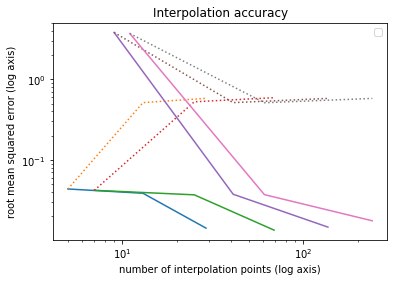

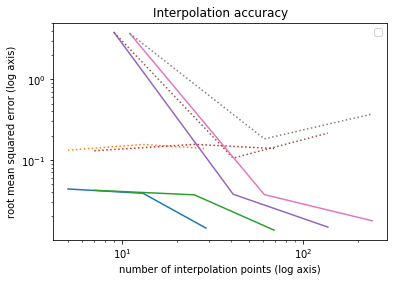

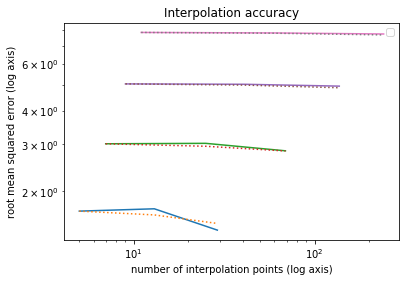

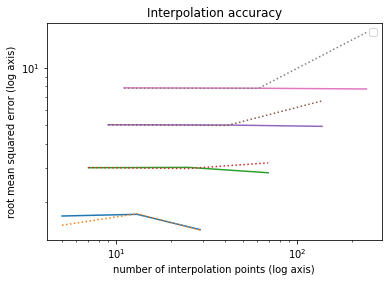

In [51]:
# plot results
compare_results(
    results_borehole_sparse_dolo_1stage_lowdensity, 
    results_borehole_sparse_dolo_2stage_lowdensity, 
    params_borehole_sparse_dolo_1stage_lowdensity, 
    params_borehole_sparse_dolo_2stage_lowdensity
)
compare_results(
    results_borehole_sparse_dolo_1stage, 
    results_borehole_sparse_dolo_2stage, 
    params_borehole_sparse_dolo_1stage, 
    params_borehole_sparse_dolo_2stage
)
#compare_results(
#    results_borehole_sparse_dolo_1stage_highdensity, 
#    results_borehole_sparse_dolo_2stage_highdensity, 
#    params_borehole_sparse_dolo_1stage_highdensity, 
#    params_borehole_sparse_dolo_2stage_highdensity
#)

# plot results
compare_results(
    results_zhou_sparse_dolo_1stage_lowdensity, 
    results_zhou_sparse_dolo_2stage_lowdensity, 
    params_zhou_sparse_dolo_1stage_lowdensity, 
    params_zhou_sparse_dolo_2stage_lowdensity
)
compare_results(
    results_zhou_sparse_dolo_1stage, 
    results_zhou_sparse_dolo_2stage, 
    params_zhou_sparse_dolo_1stage, 
    params_zhou_sparse_dolo_2stage
)
#compare_results(
#    results_zhou_sparse_dolo_1stage_highdensity, 
#    results_zhou_sparse_dolo_2stage_highdensity, 
#    params_zhou_sparse_dolo_1stage_highdensity, 
#    params_zhou_sparse_dolo_2stage_highdensity
#)

With increasingly fine grids, the first stage interpolation error vanishes. The issue here, however, is precisely the issue we started with: with discrete variables, we are not free to choose the density of the grid in the respective dimension. Having finer grids in the continuous dimensions still reduces the first stage error. 

In light of this, one potential way to improve upon accuracy and computational performance of sparse grid interpolation on discrete domains is to "endogenize" the grid on the continuous dimensions, i.e. set the grid points in the continuous dimensions in a way that is optimal given the used first stage interpolation method.

Finally, we compare the feasible implementation of a sparse grid method (i.e. smolyak interpolation with linear first stage interpolation of of-grid points) with the benchmark linear interpolation on a regular grid.

* Borehole function

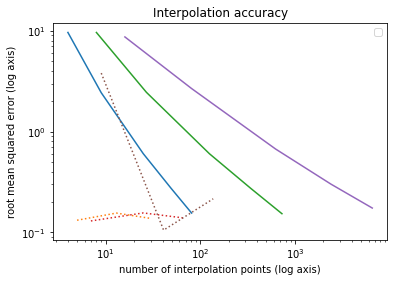

In [52]:
# plot results
compare_results(
    results_borehole_linear, 
    results_borehole_sparse_dolo_2stage, 
    params_borehole_linear, 
    params_borehole_sparse_dolo_2stage
)

* Zhou function

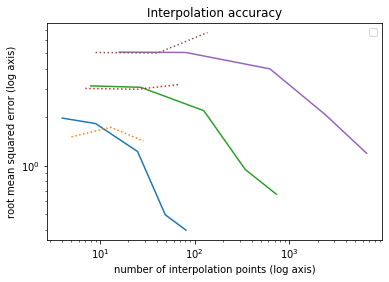

In [53]:
# plot results
compare_results(
    results_zhou_linear, 
    results_zhou_sparse_dolo_2stage, 
    params_zhou_linear, 
    params_zhou_sparse_dolo_2stage
)

# Implementation in respy

To implement any of the methods presented above, some adaptations of / additions to the respy package are required. As respy handles state spaces as indices, functionality to translate input values to indices is required. Some functions with this purpose have been included in the repository (.src/auxiliary.py). In the respy package itself, the functions get_not_interpolated_indicator, get_predictions and solve_with_backward_induction require minor changes to accomodate the new code.

# References

* Garcke, Jochen. (2013). Sparse Grids in a Nutshell.
* Judd, Kenneth L. (1998). "Numerical Methods in Economics," MIT Press Books, The MIT Press.
* Keane, Michael & Wolpin, Kenneth. (1994). The Solution and Estimation of Discrete Choice Dynamic Programming Models by Simulation and Interpolation: Monte Carlo Evidence. The Review of Economics and Statistics. 76. 648-72.
* Surjanovic, S. & Bingham, D. (2013). Virtual Library of Simulation Experiments: Test Functions and Datasets. Retrieved February 1, 2020, from http://www.sfu.ca/~ssurjano.
* Zhou, Y. (1998). Adaptive importance sampling for integration. Ph.D. Thesis, Stanford University.
